~~~
Copyright 2025 Google LLC

Licensed under the Apache License, Version 2.0 (the "License");
you may not use this file except in compliance with the License.
You may obtain a copy of the License at

    https://www.apache.org/licenses/LICENSE-2.0

Unless required by applicable law or agreed to in writing, software
distributed under the License is distributed on an "AS IS" BASIS,
WITHOUT WARRANTIES OR CONDITIONS OF ANY KIND, either express or implied.
See the License for the specific language governing permissions and
limitations under the License.
~~~

# Prompt MedGemma 1.5 with DICOM Computed Tomography (CT) Imaging

<table><tbody><tr>
  <td style="text-align: center">
    <a href="https://colab.research.google.com/github/google-health/medgemma/blob/main/notebooks/rl_with_trl.ipynb">
      <img alt="Google Colab logo" src="https://www.tensorflow.org/images/colab_logo_32px.png" width="32px"><br> Run in Google Colab
    </a>
  </td>
  <td style="text-align: center">
    <a href="https://console.cloud.google.com/vertex-ai/colab/import/https:%2F%2Fraw.githubusercontent.com%2FGoogle-Health%2Fmedgemma%2Fmain%2Fnotebooks%2Frl_with_trl.ipynb">
      <img alt="Google Cloud Colab Enterprise logo" src="https://lh3.googleusercontent.com/JmcxdQi-qOpctIvWKgPtrzZdJJK-J3sWE1RsfjZNwshCFgE_9fULcNpuXYTilIR2hjwN" width="32px"><br> Run in Colab Enterprise
    </a>
  </td>
  <td style="text-align: center">
    <a href="https://github.com/google-health/medgemma/blob/main/notebooks/rl_with_trl.ipynb">
      <img alt="GitHub logo" src="https://github.githubassets.com/assets/GitHub-Mark-ea2971cee799.png" width="32px"><br> View on GitHub
    </a>
  </td>
  <td style="text-align: center">
    <a href="https://huggingface.co/collections/google/medgemma-release-680aade845f90bec6a3f60c4">
      <img alt="Hugging Face logo" src="https://huggingface.co/front/assets/huggingface_logo-noborder.svg" width="32px"><br> View on Hugging Face
    </a>
  </td>
</tr></tbody></table>

This notebook demonstrates how to use 3D representation of DICOM [computed tomography (CT)](https://www.nibib.nih.gov/science-education/science-topics/computed-tomography-ct) imaging to prompt MedGemma 1.5 loaded from Hugging Face executed locally within the Colab notebook environment.

## Setup

To complete this tutorial, you'll need to have a runtime with [sufficient resources](https://ai.google.dev/gemma/docs/core#sizes) to run the MedGemma model.

You can try out MedGemma 4B in Google Colab using a L4 GPU:

1. In the upper-right of the Colab window, select **▾ (Additional connection options)**.
2. Select **Change runtime type**.
3. Under **Hardware accelerator**, select **L4 GPU**.


In [1]:
# @title Install pydicom Python library
%%capture
! pip install pydicom

In [2]:
# @title Authenticate Colab User to connect to DICOM store.
from google.colab import auth

# There will be a popup asking you to sign in with your user account and approve
# access.
auth.authenticate_user()

# Retrieve CT Imaging from Imaging Data Commons (IDC)

[Imaging Data Commons (IDC)](ttps://datacommons.cancer.gov/repository/imaging-data-commons#) is one of the largest publicly available, de-identified, repositories for cancer imaging. The repository is funded by the [National Cancer Institute (NCI)](https://www.cancer.gov/), an institute of the [National Institutes of Health (NIH)](https://www.nih.gov/), a part of the [U.S. Department of Health and Human Service](https://www.hhs.gov/). IDC contains imaging for all major medical imaging modalities. Imaging is stored within the archive as [DICOM](https://www.dicomstandard.org/). Imaging and its associated metadata can be searched, visualized through the [IDC website](https://portal.imaging.datacommons.cancer.gov/explore/), [BigQuery](https://cloud.google.com/healthcare-api/docs/resources/public-datasets/idc), and can be accessed using DICOMweb ([IDC tutorial](https://learn.canceridc.dev/data/downloading-data/dicomweb-access)).

DICOM is the medical imaging format generated by CT scanners.
[DICOM](https://www.dicomstandard.org/) images are uniquely identified by three UIDs, Study Instance UID, Series Instance UID, and a SOP Instance UID.  The Colab retrieve a CT imaging from IDC by downloading all of the images associated with a CT scan. Conceptually, a Study Instance UID can be thought of as the UID that identifies all imaging acquired or generated as a result of a patient exam. Each medical image acquired as part of the exam, (e.g., CT acquisition), is identified by a unique Series Instance UID. Each image acquired or generated as part of the an acquisition is, in turn, identified with a unique SOP Instance UID.

CT imaging is commonly represented as an ordered collection of 2D images (slices). Each slice is represented by a 2D image that describes an axial cross section (volume) of the imaged body.



In [3]:
# @title Read metadata for the DICOM instances in a series.

import google.auth
import google.auth.transport
import pydicom
import requests

# Get oauth credentials to
auth_credentials = google.auth.default(['https://www.googleapis.com/auth/cloud-healthcare'])[0]
auth_credentials.refresh(google.auth.transport.requests.Request())

# This notebook uses imaging hosted in the Imaging Data Commons (IDC) archive
# This notebook utilizes data from The Cancer Imaging Archive (TCIA).
# https://www.cancerimagingarchive.net/collection/colorectal-liver-metastases/
# Liver CRLM - CT 1026
study_instance_uid = "1.3.6.1.4.1.14519.5.2.1.9203.8273.982856921320609617394372605436"
series_instance_uid = "1.3.6.1.4.1.14519.5.2.1.9203.8273.275179554444442893192427753220"

# Read DICOM instance metadata for imaging
headers = {"Authorization" : f"Bearer {auth_credentials.token}"}
series = f"https://healthcare.googleapis.com/v1/projects/hai-cd3-foundations/locations/us-central1/datasets/public/dicomStores/test-images/dicomWeb/studies/{study_instance_uid}/series/{series_instance_uid}"
metadata = requests.get(f"{series}/instances", headers=headers).json()
dicom_instances = [pydicom.Dataset.from_json(i) for i in metadata]
# Order instance metadata by instance number
dicom_instances = sorted(dicom_instances, key=lambda i: int(i.InstanceNumber))

# Sample 85 slices equallly across CT volume
MAX_SLICE = 85
if len(dicom_instances) > MAX_SLICE:
  dicom_instances = [dicom_instances[int(round(i /(MAX_SLICE - 1) * (len(dicom_instances)-1)))] for i in range(MAX_SLICE)]


In [4]:

# @title Load slice imaging for all DICOM instances in the series.

# @markdown Background: Each slice of a CT imaging is typically represented in DICOM as its own instance.
import concurrent
import io


def _download_dcm_instance(i: pydicom.Dataset) -> bytes:
  return requests.get(f"{series}/instances/{i.SOPInstanceUID}", headers=headers).content


# Download DICOM instance
headers = {"Accept": "application/dicom; transfer-syntax=*",
           "Authorization" : f"Bearer {auth_credentials.token}"}
ct_volume_slices = []
with concurrent.futures.ThreadPoolExecutor(max_workers=3) as executor:
  for dcm_instance_bytes in executor.map(_download_dcm_instance, dicom_instances):
    with io.BytesIO(dcm_instance_bytes) as pd:
      # Read DICOM instance from in memory buffer
      with pydicom.dcmread(pd) as dcm:
        # Extract CT Slice pixel data from and scale to hounsfield units.
        ct_volume_slices.append(pydicom.pixels.apply_rescale(dcm.pixel_array, dcm))


#Define windowing for CT imaging

The voxels encoded within CT imaging are typically expressed as signed 16-bit [hounsfield units (HU)](https://en.wikipedia.org/wiki/Hounsfield_scale), one value per-voxel. CT images are commonly visualized as a grayscale image. The imaging is typically [windowed](https://radiopaedia.org/articles/windowing-ct) for human reading tasks to increase the contrast across a task specific diagnostic range.

The MedGemma image encoder accepts RGB, 8-bits per channel, imaging as input. MedGemma has also been trained to interpret CT imaging where the RGB channels of input imaging correspond to a novel windowing representation to enable it to interpret multiple representations of CT imaging simultaneously.  Specifically, MedGemma 1.5 has been trained with the components defined as follows:
  * Red (component 0):  Wide window; range: -1024 HU ([air](https://en.wikipedia.org/wiki/Hounsfield_scale)) to 1024 HU ([above bone](https://en.wikipedia.org/wiki/Hounsfield_scale))
  * Green (component 1):  Soft tissue window; range: 135 HU ([fat](https://en.wikipedia.org/wiki/Hounsfield_scale)) to 215 HU ([start of bone](https://en.wikipedia.org/wiki/Hounsfield_scale))
  * Blue (component 2): Brain window; range: 0 HU ([water](https://en.wikipedia.org/wiki/Hounsfield_scale)) to 80 HU  ([brain](https://en.wikipedia.org/wiki/Hounsfield_scale))

  Because, each of the RGB channels in the prompt imaging correspond to a windowing prompt imaging prepared using this method will visually appear color.



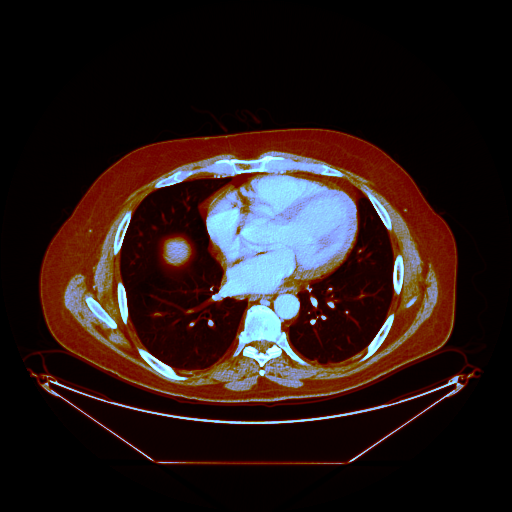

In [5]:
import io

import numpy as np
import IPython.display
import PIL.Image

def norm(ct_vol: np.ndarray, min: float, max: float) -> np.ndarray:
  """Window and normalize CT imaging Houndsfield values to values 0 - 255."""
  ct_vol = np.clip(ct_vol, min, max)  # Clip the imaging value range
  ct_vol = ct_vol.astype(np.float32)
  ct_vol -= min
  ct_vol /= (max - min) # Norm to values between 0 - 1.0
  ct_vol *= 255.0  # Norm to values been 0 - 255.0
  return ct_vol

def window(ct_vol: np.ndarray, dcm: pydicom.Dataset) -> np.ndarray:
  # Window CT slice imaging with three windows (wide, mediastinum(chest), brain)
  # Imaging will appear color when visualized, RGB channels contain different
  # representations of the data.
  window_clips = [(-1024, 1024), (-135, 215), (0, 80)]
  return np.stack([norm(ct_vol, clip[0], clip[1]) for clip in window_clips], axis=-1)

# Window CT Slice Data.
normalized_ct_volume_slices = []
for ct_slice in ct_volume_slices:
  windowed_slice = window(ct_slice, dcm)
  # Round slice voxels to nearest integer number.
  windowed_slice = np.round(windowed_slice, 0).astype(np.uint8)
  normalized_ct_volume_slices.append(windowed_slice)

# @markdown **Visualize CT Slice Windowing**

# Visualize windowed CT Slices.
ct_slice_images = [PIL.Image.fromarray(ct_slice) for ct_slice in normalized_ct_volume_slices]

# Save slice images as animated GIF
with io.BytesIO() as gif_bytes:
  ct_slice_images[0].save(gif_bytes, format="GIF", loop=0, save_all=True, append_images=ct_slice_images[1:], optimize=False, duration=len(normalized_ct_volume_slices)*3)
  ct_slice_animation = gif_bytes.getvalue()
# Display animated GIF in Colab
IPython.display.display(IPython.display.Image(data=ct_slice_animation, format="GIF"))


In [6]:
# @title Construct MedGemma 1.5 prompt formatted as a chat completion.

import base64
import PIL.Image

def _encode(data: np.ndarray) -> str:
  """Encode CT slice imaging inline in prompt."""
  # Image format to encode ct slice images as.
  # options: "jpeg" or "png"
  format = "jpeg"
  with io.BytesIO() as img_bytes:
    with PIL.Image.fromarray(data) as img:
      img.save(img_bytes, format=format)
    img_bytes.seek(0)
    encoded_string = base64.b64encode(img_bytes.getbuffer()).decode("utf-8")
  return f"data:image/{format};base64,{encoded_string}"


instruction = ("You are an instructor teaching medical students. You are "
               "analyzing a contiguous block of CT slices from the center of "
               "the abdomen. Please review the slices provided below "
               "carefully.")

query_text = ("\n\nBased on the visual evidence in the slices provided above, "
              "is this image a good teaching example of liver pathology? "
              "Comment on hypodense lesions or other hepatic irregularities. "
              "Do not comment on findings outside the liver. Please provide "
              "your reasoning and conclude with a 'Final Answer: yes' or "
              "'Final Answer: no'."
)

content = []
content.append({"type": "text", "text": instruction})
for slice_number, ct_slice in enumerate(normalized_ct_volume_slices, 1):
  content.append({"type": "image", "image": _encode(ct_slice)})
  content.append({"type": "text", "text": f"SLICE {slice_number}"})
content.append({"type": "text", "text": query_text})

messages = [
    {
        "role": "user",
        "content": content
    }
]

In [7]:
# @title Display full MedGemma 1.5 prompt.
import json

from IPython.display import display, Markdown


def truncate_prompt(obj, max_len):
  # Clip strings in prompt to avoid displaying excessively large content in Colab notebook.
  if isinstance(obj, dict):
    return {k: truncate_prompt(v, max_len) for k, v in obj.items()}
  elif isinstance(obj, list):
    return [truncate_prompt(elem, max_len) for elem in obj]
  elif isinstance(obj, str) and len(obj) > max_len:
    return obj[:max_len] + "..."  # Add ellipsis for truncated strings
  return obj

txt = json.dumps(truncate_prompt(messages, 100), indent=4, sort_keys=True)
display(Markdown(f"```json\n{txt}"))

```json
[
    {
        "content": [
            {
                "text": "You are an instructor teaching medical students. You are analyzing a contiguous block of CT slices f...",
                "type": "text"
            },
            {
                "image": "data:image/jpeg;base64,/9j/4AAQSkZJRgABAQAAAQABAAD/2wBDAAgGBgcGBQgHBwcJCQgKDBQNDAsLDBkSEw8UHRofHh0aH...",
                "type": "image"
            },
            {
                "text": "SLICE 1",
                "type": "text"
            },
            {
                "image": "data:image/jpeg;base64,/9j/4AAQSkZJRgABAQAAAQABAAD/2wBDAAgGBgcGBQgHBwcJCQgKDBQNDAsLDBkSEw8UHRofHh0aH...",
                "type": "image"
            },
            {
                "text": "SLICE 2",
                "type": "text"
            },
            {
                "image": "data:image/jpeg;base64,/9j/4AAQSkZJRgABAQAAAQABAAD/2wBDAAgGBgcGBQgHBwcJCQgKDBQNDAsLDBkSEw8UHRofHh0aH...",
                "type": "image"
            },
            {
                "text": "SLICE 3",
                "type": "text"
            },
            {
                "image": "data:image/jpeg;base64,/9j/4AAQSkZJRgABAQAAAQABAAD/2wBDAAgGBgcGBQgHBwcJCQgKDBQNDAsLDBkSEw8UHRofHh0aH...",
                "type": "image"
            },
            {
                "text": "SLICE 4",
                "type": "text"
            },
            {
                "image": "data:image/jpeg;base64,/9j/4AAQSkZJRgABAQAAAQABAAD/2wBDAAgGBgcGBQgHBwcJCQgKDBQNDAsLDBkSEw8UHRofHh0aH...",
                "type": "image"
            },
            {
                "text": "SLICE 5",
                "type": "text"
            },
            {
                "image": "data:image/jpeg;base64,/9j/4AAQSkZJRgABAQAAAQABAAD/2wBDAAgGBgcGBQgHBwcJCQgKDBQNDAsLDBkSEw8UHRofHh0aH...",
                "type": "image"
            },
            {
                "text": "SLICE 6",
                "type": "text"
            },
            {
                "image": "data:image/jpeg;base64,/9j/4AAQSkZJRgABAQAAAQABAAD/2wBDAAgGBgcGBQgHBwcJCQgKDBQNDAsLDBkSEw8UHRofHh0aH...",
                "type": "image"
            },
            {
                "text": "SLICE 7",
                "type": "text"
            },
            {
                "image": "data:image/jpeg;base64,/9j/4AAQSkZJRgABAQAAAQABAAD/2wBDAAgGBgcGBQgHBwcJCQgKDBQNDAsLDBkSEw8UHRofHh0aH...",
                "type": "image"
            },
            {
                "text": "SLICE 8",
                "type": "text"
            },
            {
                "image": "data:image/jpeg;base64,/9j/4AAQSkZJRgABAQAAAQABAAD/2wBDAAgGBgcGBQgHBwcJCQgKDBQNDAsLDBkSEw8UHRofHh0aH...",
                "type": "image"
            },
            {
                "text": "SLICE 9",
                "type": "text"
            },
            {
                "image": "data:image/jpeg;base64,/9j/4AAQSkZJRgABAQAAAQABAAD/2wBDAAgGBgcGBQgHBwcJCQgKDBQNDAsLDBkSEw8UHRofHh0aH...",
                "type": "image"
            },
            {
                "text": "SLICE 10",
                "type": "text"
            },
            {
                "image": "data:image/jpeg;base64,/9j/4AAQSkZJRgABAQAAAQABAAD/2wBDAAgGBgcGBQgHBwcJCQgKDBQNDAsLDBkSEw8UHRofHh0aH...",
                "type": "image"
            },
            {
                "text": "SLICE 11",
                "type": "text"
            },
            {
                "image": "data:image/jpeg;base64,/9j/4AAQSkZJRgABAQAAAQABAAD/2wBDAAgGBgcGBQgHBwcJCQgKDBQNDAsLDBkSEw8UHRofHh0aH...",
                "type": "image"
            },
            {
                "text": "SLICE 12",
                "type": "text"
            },
            {
                "image": "data:image/jpeg;base64,/9j/4AAQSkZJRgABAQAAAQABAAD/2wBDAAgGBgcGBQgHBwcJCQgKDBQNDAsLDBkSEw8UHRofHh0aH...",
                "type": "image"
            },
            {
                "text": "SLICE 13",
                "type": "text"
            },
            {
                "image": "data:image/jpeg;base64,/9j/4AAQSkZJRgABAQAAAQABAAD/2wBDAAgGBgcGBQgHBwcJCQgKDBQNDAsLDBkSEw8UHRofHh0aH...",
                "type": "image"
            },
            {
                "text": "SLICE 14",
                "type": "text"
            },
            {
                "image": "data:image/jpeg;base64,/9j/4AAQSkZJRgABAQAAAQABAAD/2wBDAAgGBgcGBQgHBwcJCQgKDBQNDAsLDBkSEw8UHRofHh0aH...",
                "type": "image"
            },
            {
                "text": "SLICE 15",
                "type": "text"
            },
            {
                "image": "data:image/jpeg;base64,/9j/4AAQSkZJRgABAQAAAQABAAD/2wBDAAgGBgcGBQgHBwcJCQgKDBQNDAsLDBkSEw8UHRofHh0aH...",
                "type": "image"
            },
            {
                "text": "SLICE 16",
                "type": "text"
            },
            {
                "image": "data:image/jpeg;base64,/9j/4AAQSkZJRgABAQAAAQABAAD/2wBDAAgGBgcGBQgHBwcJCQgKDBQNDAsLDBkSEw8UHRofHh0aH...",
                "type": "image"
            },
            {
                "text": "SLICE 17",
                "type": "text"
            },
            {
                "image": "data:image/jpeg;base64,/9j/4AAQSkZJRgABAQAAAQABAAD/2wBDAAgGBgcGBQgHBwcJCQgKDBQNDAsLDBkSEw8UHRofHh0aH...",
                "type": "image"
            },
            {
                "text": "SLICE 18",
                "type": "text"
            },
            {
                "image": "data:image/jpeg;base64,/9j/4AAQSkZJRgABAQAAAQABAAD/2wBDAAgGBgcGBQgHBwcJCQgKDBQNDAsLDBkSEw8UHRofHh0aH...",
                "type": "image"
            },
            {
                "text": "SLICE 19",
                "type": "text"
            },
            {
                "image": "data:image/jpeg;base64,/9j/4AAQSkZJRgABAQAAAQABAAD/2wBDAAgGBgcGBQgHBwcJCQgKDBQNDAsLDBkSEw8UHRofHh0aH...",
                "type": "image"
            },
            {
                "text": "SLICE 20",
                "type": "text"
            },
            {
                "image": "data:image/jpeg;base64,/9j/4AAQSkZJRgABAQAAAQABAAD/2wBDAAgGBgcGBQgHBwcJCQgKDBQNDAsLDBkSEw8UHRofHh0aH...",
                "type": "image"
            },
            {
                "text": "SLICE 21",
                "type": "text"
            },
            {
                "image": "data:image/jpeg;base64,/9j/4AAQSkZJRgABAQAAAQABAAD/2wBDAAgGBgcGBQgHBwcJCQgKDBQNDAsLDBkSEw8UHRofHh0aH...",
                "type": "image"
            },
            {
                "text": "SLICE 22",
                "type": "text"
            },
            {
                "image": "data:image/jpeg;base64,/9j/4AAQSkZJRgABAQAAAQABAAD/2wBDAAgGBgcGBQgHBwcJCQgKDBQNDAsLDBkSEw8UHRofHh0aH...",
                "type": "image"
            },
            {
                "text": "SLICE 23",
                "type": "text"
            },
            {
                "image": "data:image/jpeg;base64,/9j/4AAQSkZJRgABAQAAAQABAAD/2wBDAAgGBgcGBQgHBwcJCQgKDBQNDAsLDBkSEw8UHRofHh0aH...",
                "type": "image"
            },
            {
                "text": "SLICE 24",
                "type": "text"
            },
            {
                "image": "data:image/jpeg;base64,/9j/4AAQSkZJRgABAQAAAQABAAD/2wBDAAgGBgcGBQgHBwcJCQgKDBQNDAsLDBkSEw8UHRofHh0aH...",
                "type": "image"
            },
            {
                "text": "SLICE 25",
                "type": "text"
            },
            {
                "image": "data:image/jpeg;base64,/9j/4AAQSkZJRgABAQAAAQABAAD/2wBDAAgGBgcGBQgHBwcJCQgKDBQNDAsLDBkSEw8UHRofHh0aH...",
                "type": "image"
            },
            {
                "text": "SLICE 26",
                "type": "text"
            },
            {
                "image": "data:image/jpeg;base64,/9j/4AAQSkZJRgABAQAAAQABAAD/2wBDAAgGBgcGBQgHBwcJCQgKDBQNDAsLDBkSEw8UHRofHh0aH...",
                "type": "image"
            },
            {
                "text": "SLICE 27",
                "type": "text"
            },
            {
                "image": "data:image/jpeg;base64,/9j/4AAQSkZJRgABAQAAAQABAAD/2wBDAAgGBgcGBQgHBwcJCQgKDBQNDAsLDBkSEw8UHRofHh0aH...",
                "type": "image"
            },
            {
                "text": "SLICE 28",
                "type": "text"
            },
            {
                "image": "data:image/jpeg;base64,/9j/4AAQSkZJRgABAQAAAQABAAD/2wBDAAgGBgcGBQgHBwcJCQgKDBQNDAsLDBkSEw8UHRofHh0aH...",
                "type": "image"
            },
            {
                "text": "SLICE 29",
                "type": "text"
            },
            {
                "image": "data:image/jpeg;base64,/9j/4AAQSkZJRgABAQAAAQABAAD/2wBDAAgGBgcGBQgHBwcJCQgKDBQNDAsLDBkSEw8UHRofHh0aH...",
                "type": "image"
            },
            {
                "text": "SLICE 30",
                "type": "text"
            },
            {
                "image": "data:image/jpeg;base64,/9j/4AAQSkZJRgABAQAAAQABAAD/2wBDAAgGBgcGBQgHBwcJCQgKDBQNDAsLDBkSEw8UHRofHh0aH...",
                "type": "image"
            },
            {
                "text": "SLICE 31",
                "type": "text"
            },
            {
                "image": "data:image/jpeg;base64,/9j/4AAQSkZJRgABAQAAAQABAAD/2wBDAAgGBgcGBQgHBwcJCQgKDBQNDAsLDBkSEw8UHRofHh0aH...",
                "type": "image"
            },
            {
                "text": "SLICE 32",
                "type": "text"
            },
            {
                "image": "data:image/jpeg;base64,/9j/4AAQSkZJRgABAQAAAQABAAD/2wBDAAgGBgcGBQgHBwcJCQgKDBQNDAsLDBkSEw8UHRofHh0aH...",
                "type": "image"
            },
            {
                "text": "SLICE 33",
                "type": "text"
            },
            {
                "image": "data:image/jpeg;base64,/9j/4AAQSkZJRgABAQAAAQABAAD/2wBDAAgGBgcGBQgHBwcJCQgKDBQNDAsLDBkSEw8UHRofHh0aH...",
                "type": "image"
            },
            {
                "text": "SLICE 34",
                "type": "text"
            },
            {
                "image": "data:image/jpeg;base64,/9j/4AAQSkZJRgABAQAAAQABAAD/2wBDAAgGBgcGBQgHBwcJCQgKDBQNDAsLDBkSEw8UHRofHh0aH...",
                "type": "image"
            },
            {
                "text": "SLICE 35",
                "type": "text"
            },
            {
                "image": "data:image/jpeg;base64,/9j/4AAQSkZJRgABAQAAAQABAAD/2wBDAAgGBgcGBQgHBwcJCQgKDBQNDAsLDBkSEw8UHRofHh0aH...",
                "type": "image"
            },
            {
                "text": "SLICE 36",
                "type": "text"
            },
            {
                "image": "data:image/jpeg;base64,/9j/4AAQSkZJRgABAQAAAQABAAD/2wBDAAgGBgcGBQgHBwcJCQgKDBQNDAsLDBkSEw8UHRofHh0aH...",
                "type": "image"
            },
            {
                "text": "SLICE 37",
                "type": "text"
            },
            {
                "image": "data:image/jpeg;base64,/9j/4AAQSkZJRgABAQAAAQABAAD/2wBDAAgGBgcGBQgHBwcJCQgKDBQNDAsLDBkSEw8UHRofHh0aH...",
                "type": "image"
            },
            {
                "text": "SLICE 38",
                "type": "text"
            },
            {
                "image": "data:image/jpeg;base64,/9j/4AAQSkZJRgABAQAAAQABAAD/2wBDAAgGBgcGBQgHBwcJCQgKDBQNDAsLDBkSEw8UHRofHh0aH...",
                "type": "image"
            },
            {
                "text": "SLICE 39",
                "type": "text"
            },
            {
                "image": "data:image/jpeg;base64,/9j/4AAQSkZJRgABAQAAAQABAAD/2wBDAAgGBgcGBQgHBwcJCQgKDBQNDAsLDBkSEw8UHRofHh0aH...",
                "type": "image"
            },
            {
                "text": "SLICE 40",
                "type": "text"
            },
            {
                "image": "data:image/jpeg;base64,/9j/4AAQSkZJRgABAQAAAQABAAD/2wBDAAgGBgcGBQgHBwcJCQgKDBQNDAsLDBkSEw8UHRofHh0aH...",
                "type": "image"
            },
            {
                "text": "SLICE 41",
                "type": "text"
            },
            {
                "image": "data:image/jpeg;base64,/9j/4AAQSkZJRgABAQAAAQABAAD/2wBDAAgGBgcGBQgHBwcJCQgKDBQNDAsLDBkSEw8UHRofHh0aH...",
                "type": "image"
            },
            {
                "text": "SLICE 42",
                "type": "text"
            },
            {
                "image": "data:image/jpeg;base64,/9j/4AAQSkZJRgABAQAAAQABAAD/2wBDAAgGBgcGBQgHBwcJCQgKDBQNDAsLDBkSEw8UHRofHh0aH...",
                "type": "image"
            },
            {
                "text": "SLICE 43",
                "type": "text"
            },
            {
                "image": "data:image/jpeg;base64,/9j/4AAQSkZJRgABAQAAAQABAAD/2wBDAAgGBgcGBQgHBwcJCQgKDBQNDAsLDBkSEw8UHRofHh0aH...",
                "type": "image"
            },
            {
                "text": "SLICE 44",
                "type": "text"
            },
            {
                "image": "data:image/jpeg;base64,/9j/4AAQSkZJRgABAQAAAQABAAD/2wBDAAgGBgcGBQgHBwcJCQgKDBQNDAsLDBkSEw8UHRofHh0aH...",
                "type": "image"
            },
            {
                "text": "SLICE 45",
                "type": "text"
            },
            {
                "image": "data:image/jpeg;base64,/9j/4AAQSkZJRgABAQAAAQABAAD/2wBDAAgGBgcGBQgHBwcJCQgKDBQNDAsLDBkSEw8UHRofHh0aH...",
                "type": "image"
            },
            {
                "text": "SLICE 46",
                "type": "text"
            },
            {
                "image": "data:image/jpeg;base64,/9j/4AAQSkZJRgABAQAAAQABAAD/2wBDAAgGBgcGBQgHBwcJCQgKDBQNDAsLDBkSEw8UHRofHh0aH...",
                "type": "image"
            },
            {
                "text": "SLICE 47",
                "type": "text"
            },
            {
                "image": "data:image/jpeg;base64,/9j/4AAQSkZJRgABAQAAAQABAAD/2wBDAAgGBgcGBQgHBwcJCQgKDBQNDAsLDBkSEw8UHRofHh0aH...",
                "type": "image"
            },
            {
                "text": "SLICE 48",
                "type": "text"
            },
            {
                "image": "data:image/jpeg;base64,/9j/4AAQSkZJRgABAQAAAQABAAD/2wBDAAgGBgcGBQgHBwcJCQgKDBQNDAsLDBkSEw8UHRofHh0aH...",
                "type": "image"
            },
            {
                "text": "SLICE 49",
                "type": "text"
            },
            {
                "image": "data:image/jpeg;base64,/9j/4AAQSkZJRgABAQAAAQABAAD/2wBDAAgGBgcGBQgHBwcJCQgKDBQNDAsLDBkSEw8UHRofHh0aH...",
                "type": "image"
            },
            {
                "text": "SLICE 50",
                "type": "text"
            },
            {
                "image": "data:image/jpeg;base64,/9j/4AAQSkZJRgABAQAAAQABAAD/2wBDAAgGBgcGBQgHBwcJCQgKDBQNDAsLDBkSEw8UHRofHh0aH...",
                "type": "image"
            },
            {
                "text": "SLICE 51",
                "type": "text"
            },
            {
                "image": "data:image/jpeg;base64,/9j/4AAQSkZJRgABAQAAAQABAAD/2wBDAAgGBgcGBQgHBwcJCQgKDBQNDAsLDBkSEw8UHRofHh0aH...",
                "type": "image"
            },
            {
                "text": "SLICE 52",
                "type": "text"
            },
            {
                "image": "data:image/jpeg;base64,/9j/4AAQSkZJRgABAQAAAQABAAD/2wBDAAgGBgcGBQgHBwcJCQgKDBQNDAsLDBkSEw8UHRofHh0aH...",
                "type": "image"
            },
            {
                "text": "SLICE 53",
                "type": "text"
            },
            {
                "image": "data:image/jpeg;base64,/9j/4AAQSkZJRgABAQAAAQABAAD/2wBDAAgGBgcGBQgHBwcJCQgKDBQNDAsLDBkSEw8UHRofHh0aH...",
                "type": "image"
            },
            {
                "text": "SLICE 54",
                "type": "text"
            },
            {
                "image": "data:image/jpeg;base64,/9j/4AAQSkZJRgABAQAAAQABAAD/2wBDAAgGBgcGBQgHBwcJCQgKDBQNDAsLDBkSEw8UHRofHh0aH...",
                "type": "image"
            },
            {
                "text": "SLICE 55",
                "type": "text"
            },
            {
                "image": "data:image/jpeg;base64,/9j/4AAQSkZJRgABAQAAAQABAAD/2wBDAAgGBgcGBQgHBwcJCQgKDBQNDAsLDBkSEw8UHRofHh0aH...",
                "type": "image"
            },
            {
                "text": "SLICE 56",
                "type": "text"
            },
            {
                "image": "data:image/jpeg;base64,/9j/4AAQSkZJRgABAQAAAQABAAD/2wBDAAgGBgcGBQgHBwcJCQgKDBQNDAsLDBkSEw8UHRofHh0aH...",
                "type": "image"
            },
            {
                "text": "SLICE 57",
                "type": "text"
            },
            {
                "image": "data:image/jpeg;base64,/9j/4AAQSkZJRgABAQAAAQABAAD/2wBDAAgGBgcGBQgHBwcJCQgKDBQNDAsLDBkSEw8UHRofHh0aH...",
                "type": "image"
            },
            {
                "text": "SLICE 58",
                "type": "text"
            },
            {
                "image": "data:image/jpeg;base64,/9j/4AAQSkZJRgABAQAAAQABAAD/2wBDAAgGBgcGBQgHBwcJCQgKDBQNDAsLDBkSEw8UHRofHh0aH...",
                "type": "image"
            },
            {
                "text": "SLICE 59",
                "type": "text"
            },
            {
                "image": "data:image/jpeg;base64,/9j/4AAQSkZJRgABAQAAAQABAAD/2wBDAAgGBgcGBQgHBwcJCQgKDBQNDAsLDBkSEw8UHRofHh0aH...",
                "type": "image"
            },
            {
                "text": "SLICE 60",
                "type": "text"
            },
            {
                "image": "data:image/jpeg;base64,/9j/4AAQSkZJRgABAQAAAQABAAD/2wBDAAgGBgcGBQgHBwcJCQgKDBQNDAsLDBkSEw8UHRofHh0aH...",
                "type": "image"
            },
            {
                "text": "SLICE 61",
                "type": "text"
            },
            {
                "image": "data:image/jpeg;base64,/9j/4AAQSkZJRgABAQAAAQABAAD/2wBDAAgGBgcGBQgHBwcJCQgKDBQNDAsLDBkSEw8UHRofHh0aH...",
                "type": "image"
            },
            {
                "text": "SLICE 62",
                "type": "text"
            },
            {
                "image": "data:image/jpeg;base64,/9j/4AAQSkZJRgABAQAAAQABAAD/2wBDAAgGBgcGBQgHBwcJCQgKDBQNDAsLDBkSEw8UHRofHh0aH...",
                "type": "image"
            },
            {
                "text": "SLICE 63",
                "type": "text"
            },
            {
                "image": "data:image/jpeg;base64,/9j/4AAQSkZJRgABAQAAAQABAAD/2wBDAAgGBgcGBQgHBwcJCQgKDBQNDAsLDBkSEw8UHRofHh0aH...",
                "type": "image"
            },
            {
                "text": "SLICE 64",
                "type": "text"
            },
            {
                "image": "data:image/jpeg;base64,/9j/4AAQSkZJRgABAQAAAQABAAD/2wBDAAgGBgcGBQgHBwcJCQgKDBQNDAsLDBkSEw8UHRofHh0aH...",
                "type": "image"
            },
            {
                "text": "SLICE 65",
                "type": "text"
            },
            {
                "image": "data:image/jpeg;base64,/9j/4AAQSkZJRgABAQAAAQABAAD/2wBDAAgGBgcGBQgHBwcJCQgKDBQNDAsLDBkSEw8UHRofHh0aH...",
                "type": "image"
            },
            {
                "text": "SLICE 66",
                "type": "text"
            },
            {
                "image": "data:image/jpeg;base64,/9j/4AAQSkZJRgABAQAAAQABAAD/2wBDAAgGBgcGBQgHBwcJCQgKDBQNDAsLDBkSEw8UHRofHh0aH...",
                "type": "image"
            },
            {
                "text": "SLICE 67",
                "type": "text"
            },
            {
                "image": "data:image/jpeg;base64,/9j/4AAQSkZJRgABAQAAAQABAAD/2wBDAAgGBgcGBQgHBwcJCQgKDBQNDAsLDBkSEw8UHRofHh0aH...",
                "type": "image"
            },
            {
                "text": "SLICE 68",
                "type": "text"
            },
            {
                "image": "data:image/jpeg;base64,/9j/4AAQSkZJRgABAQAAAQABAAD/2wBDAAgGBgcGBQgHBwcJCQgKDBQNDAsLDBkSEw8UHRofHh0aH...",
                "type": "image"
            },
            {
                "text": "SLICE 69",
                "type": "text"
            },
            {
                "image": "data:image/jpeg;base64,/9j/4AAQSkZJRgABAQAAAQABAAD/2wBDAAgGBgcGBQgHBwcJCQgKDBQNDAsLDBkSEw8UHRofHh0aH...",
                "type": "image"
            },
            {
                "text": "SLICE 70",
                "type": "text"
            },
            {
                "image": "data:image/jpeg;base64,/9j/4AAQSkZJRgABAQAAAQABAAD/2wBDAAgGBgcGBQgHBwcJCQgKDBQNDAsLDBkSEw8UHRofHh0aH...",
                "type": "image"
            },
            {
                "text": "SLICE 71",
                "type": "text"
            },
            {
                "image": "data:image/jpeg;base64,/9j/4AAQSkZJRgABAQAAAQABAAD/2wBDAAgGBgcGBQgHBwcJCQgKDBQNDAsLDBkSEw8UHRofHh0aH...",
                "type": "image"
            },
            {
                "text": "SLICE 72",
                "type": "text"
            },
            {
                "image": "data:image/jpeg;base64,/9j/4AAQSkZJRgABAQAAAQABAAD/2wBDAAgGBgcGBQgHBwcJCQgKDBQNDAsLDBkSEw8UHRofHh0aH...",
                "type": "image"
            },
            {
                "text": "SLICE 73",
                "type": "text"
            },
            {
                "image": "data:image/jpeg;base64,/9j/4AAQSkZJRgABAQAAAQABAAD/2wBDAAgGBgcGBQgHBwcJCQgKDBQNDAsLDBkSEw8UHRofHh0aH...",
                "type": "image"
            },
            {
                "text": "SLICE 74",
                "type": "text"
            },
            {
                "image": "data:image/jpeg;base64,/9j/4AAQSkZJRgABAQAAAQABAAD/2wBDAAgGBgcGBQgHBwcJCQgKDBQNDAsLDBkSEw8UHRofHh0aH...",
                "type": "image"
            },
            {
                "text": "SLICE 75",
                "type": "text"
            },
            {
                "image": "data:image/jpeg;base64,/9j/4AAQSkZJRgABAQAAAQABAAD/2wBDAAgGBgcGBQgHBwcJCQgKDBQNDAsLDBkSEw8UHRofHh0aH...",
                "type": "image"
            },
            {
                "text": "SLICE 76",
                "type": "text"
            },
            {
                "image": "data:image/jpeg;base64,/9j/4AAQSkZJRgABAQAAAQABAAD/2wBDAAgGBgcGBQgHBwcJCQgKDBQNDAsLDBkSEw8UHRofHh0aH...",
                "type": "image"
            },
            {
                "text": "SLICE 77",
                "type": "text"
            },
            {
                "image": "data:image/jpeg;base64,/9j/4AAQSkZJRgABAQAAAQABAAD/2wBDAAgGBgcGBQgHBwcJCQgKDBQNDAsLDBkSEw8UHRofHh0aH...",
                "type": "image"
            },
            {
                "text": "SLICE 78",
                "type": "text"
            },
            {
                "image": "data:image/jpeg;base64,/9j/4AAQSkZJRgABAQAAAQABAAD/2wBDAAgGBgcGBQgHBwcJCQgKDBQNDAsLDBkSEw8UHRofHh0aH...",
                "type": "image"
            },
            {
                "text": "SLICE 79",
                "type": "text"
            },
            {
                "image": "data:image/jpeg;base64,/9j/4AAQSkZJRgABAQAAAQABAAD/2wBDAAgGBgcGBQgHBwcJCQgKDBQNDAsLDBkSEw8UHRofHh0aH...",
                "type": "image"
            },
            {
                "text": "SLICE 80",
                "type": "text"
            },
            {
                "image": "data:image/jpeg;base64,/9j/4AAQSkZJRgABAQAAAQABAAD/2wBDAAgGBgcGBQgHBwcJCQgKDBQNDAsLDBkSEw8UHRofHh0aH...",
                "type": "image"
            },
            {
                "text": "SLICE 81",
                "type": "text"
            },
            {
                "image": "data:image/jpeg;base64,/9j/4AAQSkZJRgABAQAAAQABAAD/2wBDAAgGBgcGBQgHBwcJCQgKDBQNDAsLDBkSEw8UHRofHh0aH...",
                "type": "image"
            },
            {
                "text": "SLICE 82",
                "type": "text"
            },
            {
                "image": "data:image/jpeg;base64,/9j/4AAQSkZJRgABAQAAAQABAAD/2wBDAAgGBgcGBQgHBwcJCQgKDBQNDAsLDBkSEw8UHRofHh0aH...",
                "type": "image"
            },
            {
                "text": "SLICE 83",
                "type": "text"
            },
            {
                "image": "data:image/jpeg;base64,/9j/4AAQSkZJRgABAQAAAQABAAD/2wBDAAgGBgcGBQgHBwcJCQgKDBQNDAsLDBkSEw8UHRofHh0aH...",
                "type": "image"
            },
            {
                "text": "SLICE 84",
                "type": "text"
            },
            {
                "image": "data:image/jpeg;base64,/9j/4AAQSkZJRgABAQAAAQABAAD/2wBDAAgGBgcGBQgHBwcJCQgKDBQNDAsLDBkSEw8UHRofHh0aH...",
                "type": "image"
            },
            {
                "text": "SLICE 85",
                "type": "text"
            },
            {
                "text": "\n\nBased on the visual evidence in the slices provided above, is this image a good teaching example o...",
                "type": "text"
            }
        ],
        "role": "user"
    }
]

# Authenticate with Hugging Face

Generate a Hugging Face `read` access token by going to [settings](https://huggingface.co/settings/tokens).

If you are using Google Colab, add your access token to the Colab Secrets manager to securely store it. If not, proceed to run the cell below to authenticate with Hugging Face.

1. Open your Google Colab notebook and click on the 🔑 Secrets tab in the left panel. <img src="https://storage.googleapis.com/generativeai-downloads/images/secrets.jpg" alt="The Secrets tab is found on the left panel." width=50%>
2. Create a new secret with the name `HF_TOKEN`.
3. Copy/paste your token key into the Value input box of `HF_TOKEN`.
4. Toggle the button on the left to allow notebook access to the secret.

In [8]:
import os
import sys


google_colab = "google.colab" in sys.modules and not os.environ.get("VERTEX_PRODUCT")

if google_colab:
    # Use secret if running in Google Colab
    from google.colab import userdata
    os.environ["HF_TOKEN"] = userdata.get("HF_TOKEN")
else:
    # Store Hugging Face data under `/content` if running in Colab Enterprise
    if os.environ.get("VERTEX_PRODUCT") == "COLAB_ENTERPRISE":
        os.environ["HF_HOME"] = "/content/hf"
    # Authenticate with Hugging Face
    from huggingface_hub import get_token
    if get_token() is None:
        from huggingface_hub import notebook_login
        notebook_login()

In [9]:
# @title Load MedGemma 1.5 from Hugging Face Hub

import torch
import transformers

model_id = "google/medgemma-4b-1.5-staging"

model_kwargs = dict(
    dtype=torch.bfloat16,
    device_map="auto",
    offload_buffers=True,
)

processor = transformers.AutoProcessor.from_pretrained(model_id, use_fast=True,  **model_kwargs)
model = transformers.AutoModelForImageTextToText.from_pretrained(model_id, **model_kwargs)

Loading checkpoint shards:   0%|          | 0/2 [00:00<?, ?it/s]

In [10]:
# @title # Run MedGemma locally and return prediction

# Tokenize text + image prompt
inputs = processor.apply_chat_template(
                 messages,
                 add_generation_prompt=True,
                 continue_final_message=False,
                 return_tensors="pt",  # pytorch
                 tokenize=True,
                 return_dict=True,
             )

# Run generative model
with torch.inference_mode():
  inputs = inputs.to(model.device, dtype=torch.bfloat16)
  # Seting do_sample to promote deterministic model response.
  # Setting max_new_tokens to unconstrain response length.
  generated_sequence = model.generate(**inputs, do_sample=False, max_new_tokens=2000)

# Process response
medgemma_response = processor.post_process_image_text_to_text(generated_sequence, skip_special_tokens=True)
decoded_inputs = processor.post_process_image_text_to_text(inputs["input_ids"], skip_special_tokens=True)
medgemma_response = medgemma_response[0]
# There can be added characters before the input text, so we need to find the
# beginning of the input text in the generated text
index_input_text = medgemma_response.find(decoded_inputs[0])
if 0 <= index_input_text and index_input_text <= 2:
  # If the input text is found, we remove it
  medgemma_response = medgemma_response[index_input_text + len(decoded_inputs[0]):]

# Display result
display(Markdown(f"---\n\n**[ MedGemma ]**\n\n{medgemma_response}\n\n---"))

The following generation flags are not valid and may be ignored: ['top_p', 'top_k']. Set `TRANSFORMERS_VERBOSITY=info` for more details.
Setting `pad_token_id` to `eos_token_id`:1 for open-end generation.


---

**[ MedGemma ]**

Based on the provided CT slices, this image is a good teaching example of liver pathology. There are multiple hypodense lesions scattered throughout the liver parenchyma. These lesions vary in size and appearance, suggesting a possible underlying process such as metastases, cysts, or abscesses. The presence of these lesions warrants further investigation to determine their nature and significance.

Final Answer: yes

---